In [203]:
import sys
import time
import math
import numpy as np
import pandas as pd
from pathlib import Path
import sklearn
import pickle
import seaborn as sns
import matplotlib as mpl
from pathlib import Path
import opendatasets as od
import tensorflow as tf

In [204]:
import matplotlib.pyplot as plt

plt.rc('font', size=12)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=12)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

In [205]:
import warnings
warnings.filterwarnings('ignore')

In [206]:
np.random.seed(22)

In [221]:
data = pd.read_csv('/kaggle/input/sign-datatset/sign_mnist_train/sign_mnist_train.csv')
test_data = pd.read_csv('/kaggle/input/sign-datatset/sign_mnist_test/sign_mnist_test.csv')

In [222]:
labels = data['label']
test_labels = test_data['label']

In [223]:
data_labels = labels

In [224]:
data.drop(columns=['label'], axis = 1, inplace = True)
test_data.drop(columns=['label'], axis = 1, inplace = True)

In [225]:
from sklearn.model_selection import StratifiedShuffleSplit

In [226]:
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=22)

training_index, val_index = next(split.split(data, labels))

training_data = data.loc[training_index]
training_labels = labels.loc[training_index]

validation_data = data.loc[val_index]
validation_labels = labels.loc[val_index]

In [227]:
training_data.shape, training_labels.shape , validation_data.shape, validation_labels.shape

((21964, 784), (21964,), (5491, 784), (5491,))

In [228]:
test_data.shape, test_labels.shape

((7172, 784), (7172,))

In [229]:
from sklearn.decomposition import PCA

In [230]:
pca = PCA(n_components=0.95)
pca.fit(training_data)

PCA(n_components=0.95)

In [231]:
pca_training_data = pd.DataFrame(pca.transform(training_data))
pca_validation_data = pd.DataFrame(pca.transform(validation_data))

In [232]:
pca_training_data.shape, training_labels.shape , pca_validation_data.shape, validation_labels.shape

((21964, 113), (21964,), (5491, 113), (5491,))

Number of components to preserve 95% of variance: 113


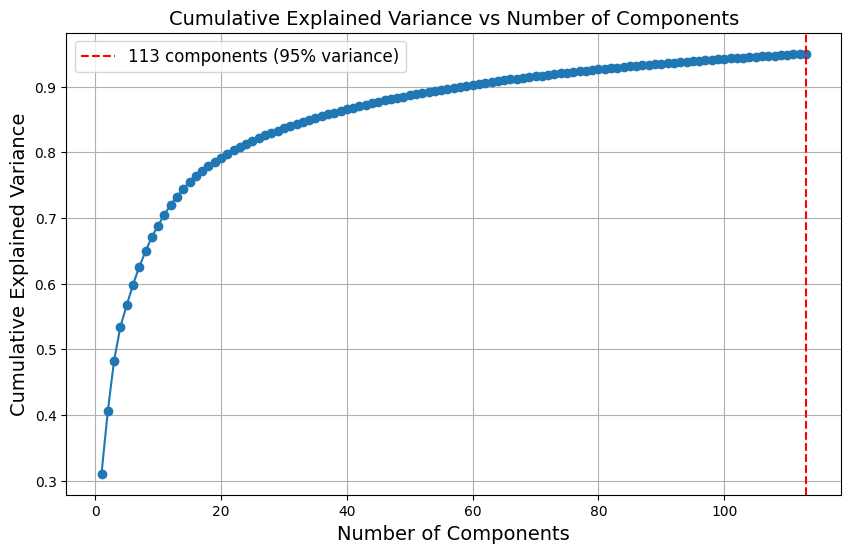

In [233]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
num_components = np.argmax(cumulative_variance >= 0.95) + 1

print(f"Number of components to preserve 95% of variance: {num_components}")

plt.figure(figsize=(10, 6))
plt.plot(np.arange(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Cumulative Explained Variance vs Number of Components')
plt.axvline(x=num_components, color='r', linestyle='--', label=f'{num_components} components (95% variance)')
plt.legend()
plt.grid()
plt.show()

After implementing PCA to the training data, we need to keep 113 components in order to preserve 95% of varience.

In [234]:
def plot_data(image_data):
    image = image_data.reshape(28, 28)
    plt.imshow(image, cmap="binary")
    plt.axis("off")

Random 10 samples from Training data before implementing PCA

In [235]:
random_sample_indexes = training_data.sample(n=10, random_state=22).index

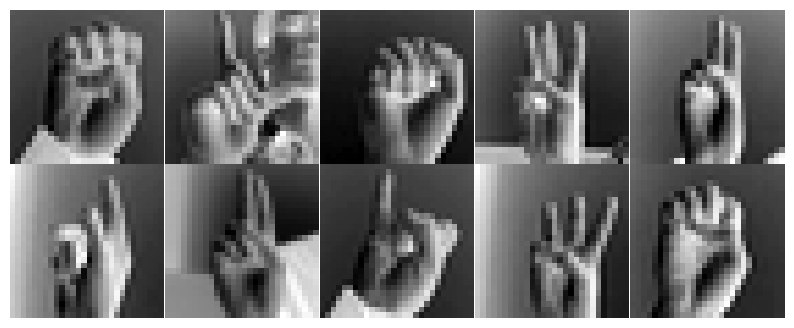

In [236]:
plt.figure(figsize=(10, 4))
for index_i, image_index in enumerate(random_sample_indexes):
    plt.subplot(2, 5, index_i + 1)
    plot_data(training_data.loc[image_index].to_numpy())
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

Random 10 samples from Training data After implementing PCA

In [237]:
training_data_recovered = pd.DataFrame(pca.inverse_transform(pca_training_data))

In [238]:
random_sample_indexes = training_data_recovered.sample(n=10, random_state=22).index

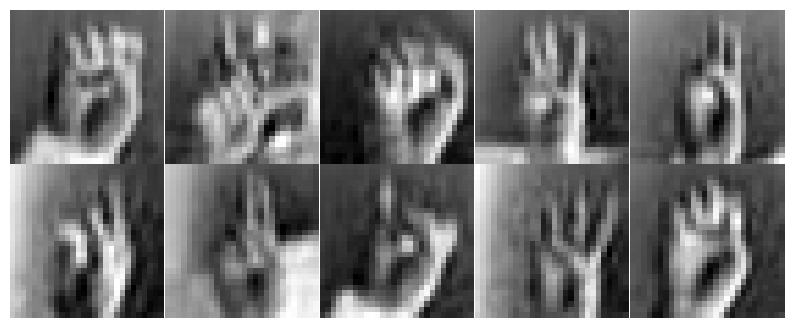

In [239]:
plt.figure(figsize=(10, 4))
for index_i, image_index in enumerate(random_sample_indexes):
    plt.subplot(2, 5, index_i + 1)
    plot_data(training_data_recovered.loc[image_index].to_numpy())
plt.subplots_adjust(wspace=0, hspace=0)
plt.show()

In [240]:
print(f"The first component explains {pca.explained_variance_ratio_[0] * 100:.4f} % variance")

The first component explains 31.0377 % variance


In [241]:
print(f"The Second component explains {pca.explained_variance_ratio_[1] * 100:.4f} % variance")

The Second component explains 9.5145 % variance


In [242]:
pca = PCA(n_components=2)
pca.fit(training_data)

transformed_data = pca.transform(training_data)

variance_explained = np.sum(pca.explained_variance_ratio_)

print(f"The variance explained by the first two components is the sum of the first and the second components which is equal to {variance_explained * 100:.2f}%")

The variance explained by the first two components is the sum of the first and the second components which is equal to 40.55%


In [243]:
from sklearn.preprocessing import MinMaxScaler
from matplotlib.offsetbox import AnnotationBbox, OffsetImage

def plot_digits(X, y, min_distance=0.04, images=None, figsize=(13, 10)):

    X_normalized = MinMaxScaler().fit_transform(X)

    neighbors = np.array([[10., 10.]])

    plt.figure(figsize=figsize)
    cmap = plt.cm.jet
    digits = np.unique(y)
    for digit in digits:
        plt.scatter(X_normalized[y == digit, 0], X_normalized[y == digit, 1],
                    c=[cmap(float(digit) / 24)], alpha=0.5)
    plt.axis("off")
    ax = plt.gca()  
    for index, image_coord in enumerate(X_normalized):
        closest_distance = np.linalg.norm(neighbors - image_coord, axis=1).min()
        if closest_distance > min_distance:
            neighbors = np.r_[neighbors, [image_coord]]
            if images is None:
                plt.text(image_coord[0], image_coord[1], str(int(y[index])),
                         color=cmap(float(y[index]) / 24),
                         fontdict={"weight": "bold", "size": 16})
            else:
                image = images[index].reshape(28, 28)
                imagebox = AnnotationBbox(OffsetImage(image, cmap="binary"),
                                          image_coord)
                ax.add_artist(imagebox)

In [247]:
def plot_principal_components(data, labels, figsize=(13, 10)):
    plt.figure(figsize=figsize)
    for i in range(25):
        plt.scatter(data[labels == i][:, 0], data[labels == i][:, 1], label=str(i), cmap="jet", alpha=0.5)
    plt.axis('off')
    plt.colorbar()
    plt.legend()
    plt.show()

PCA

In [248]:
X = training_data
y = training_labels

In [249]:
X.shape, y.shape

((21964, 784), (21964,))

In [250]:
pca = PCA(n_components=2, random_state=22)

In [251]:
X_pca_reduced = pca.fit_transform(X)

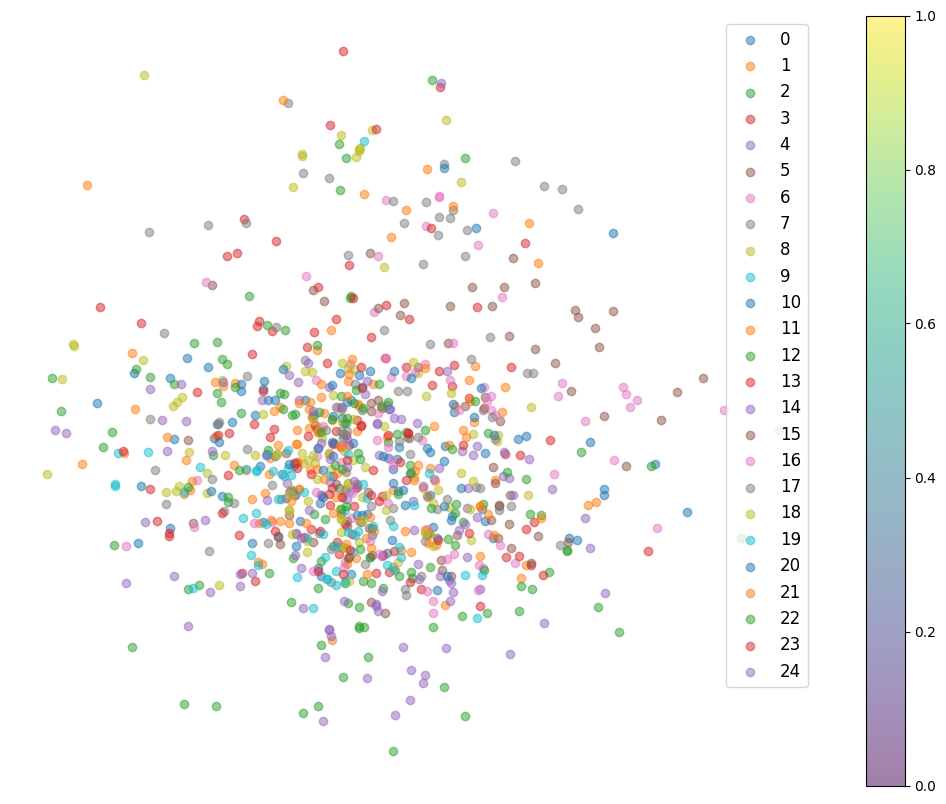

In [252]:
plot_principal_components(X_pca_reduced[:1000], y[:1000])

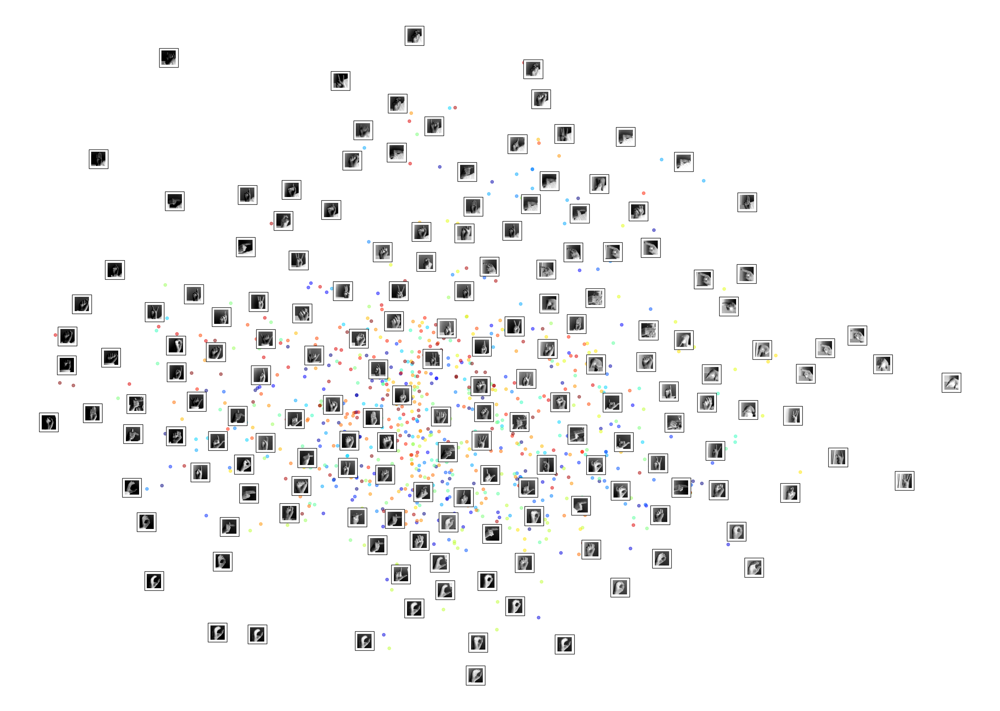

In [253]:
plot_digits(X_pca_reduced[:1000], y[:1000], images=X.values[:1000], figsize=(35, 25))

t-SNE

In [254]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, init="random", learning_rate="auto", random_state=22)

In [255]:
X_tsne_reduced = tsne.fit_transform(X)

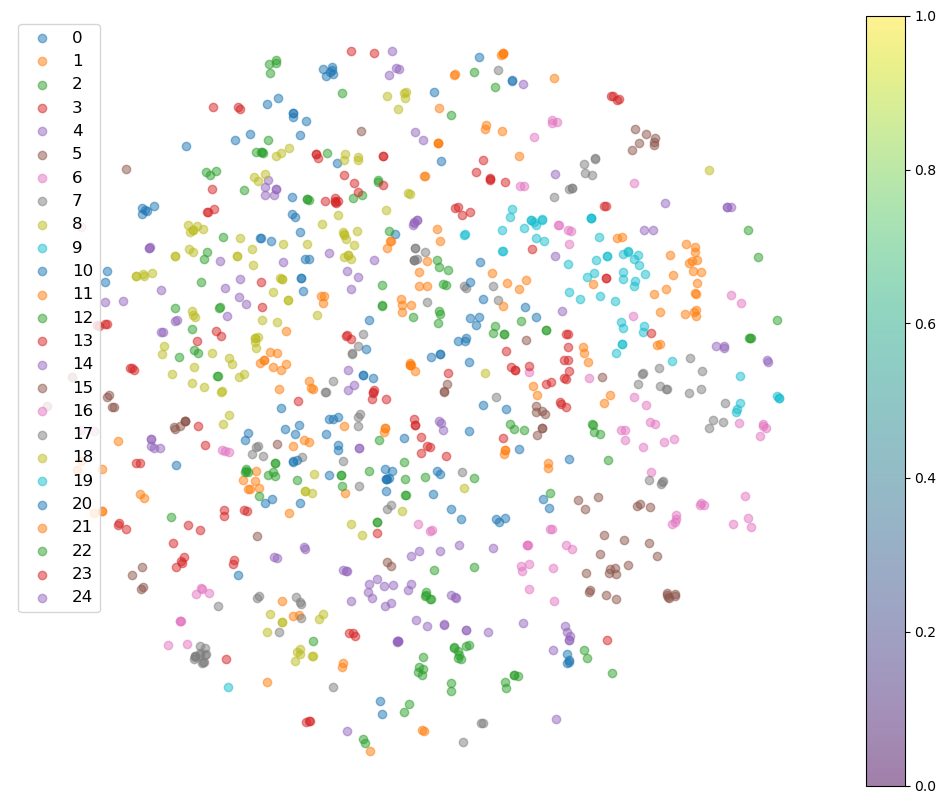

In [59]:
plot_principal_components(X_tsne_reduced[:1000], y[:1000])

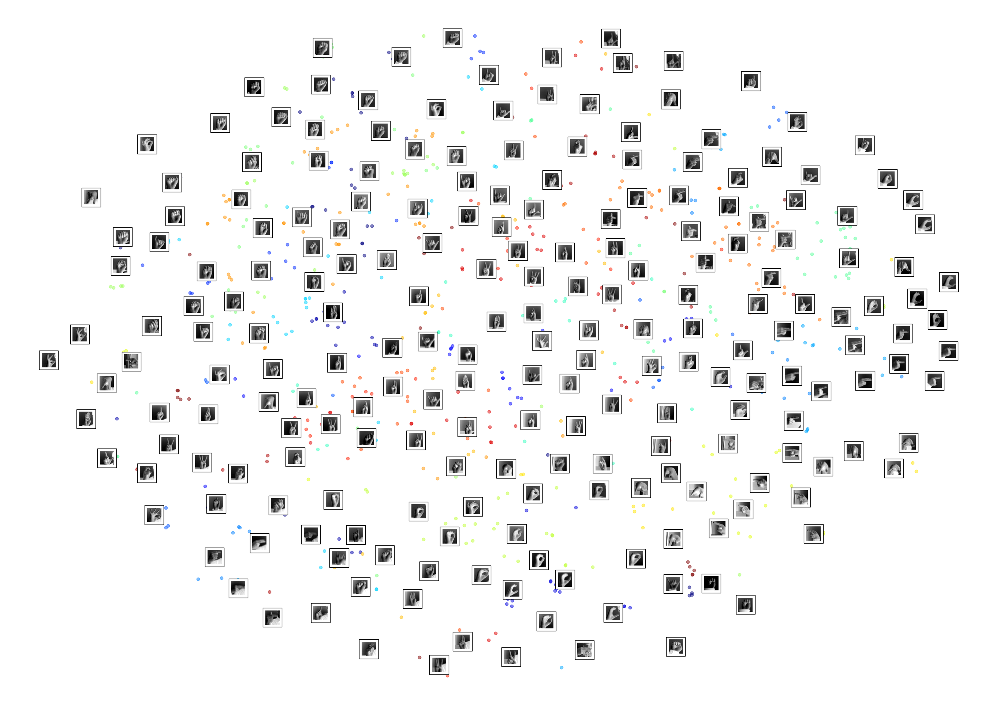

In [60]:
plot_digits(X_tsne_reduced[:1000], y[:1000], images=X.values[:1000], figsize=(35, 25))

LLE

In [61]:
from sklearn.manifold import LocallyLinearEmbedding

lle = LocallyLinearEmbedding(n_components=2, n_neighbors=10, random_state=22)

In [62]:
X_lle_reduced = lle.fit_transform(X)

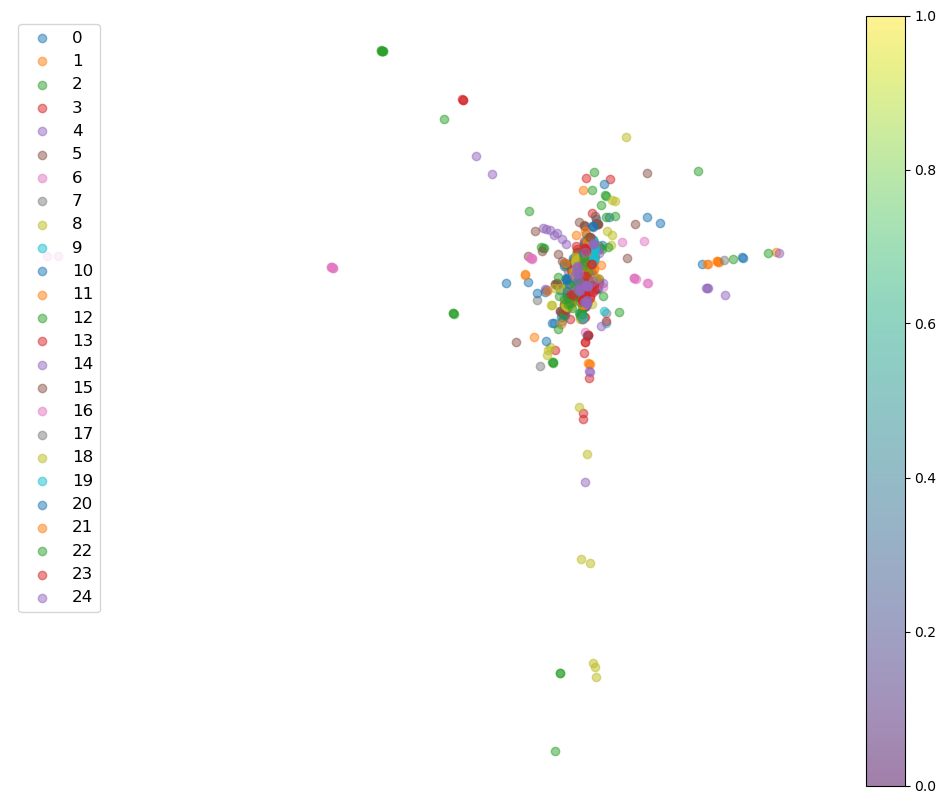

In [63]:
plot_principal_components(X_lle_reduced[:1000], y[:1000])

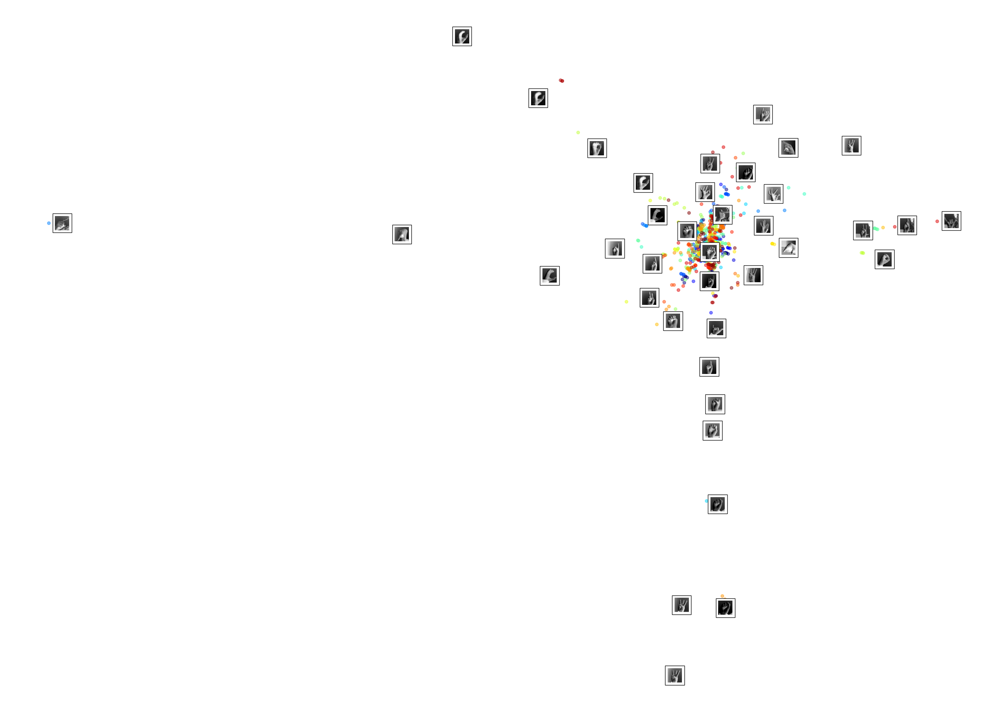

In [64]:
plot_digits(X_lle_reduced[:1000], y[:1000], images=X.values[:1000], figsize=(35, 25))

MDS

In [65]:
from sklearn.manifold import MDS

mds = MDS(n_components=2, random_state=22)

In [66]:
random_sample = training_data.sample(n = 5000, random_state = 22)

In [67]:
X = random_sample
y = training_labels[random_sample.index]

In [68]:
X_mds_reduced = mds.fit_transform(X)

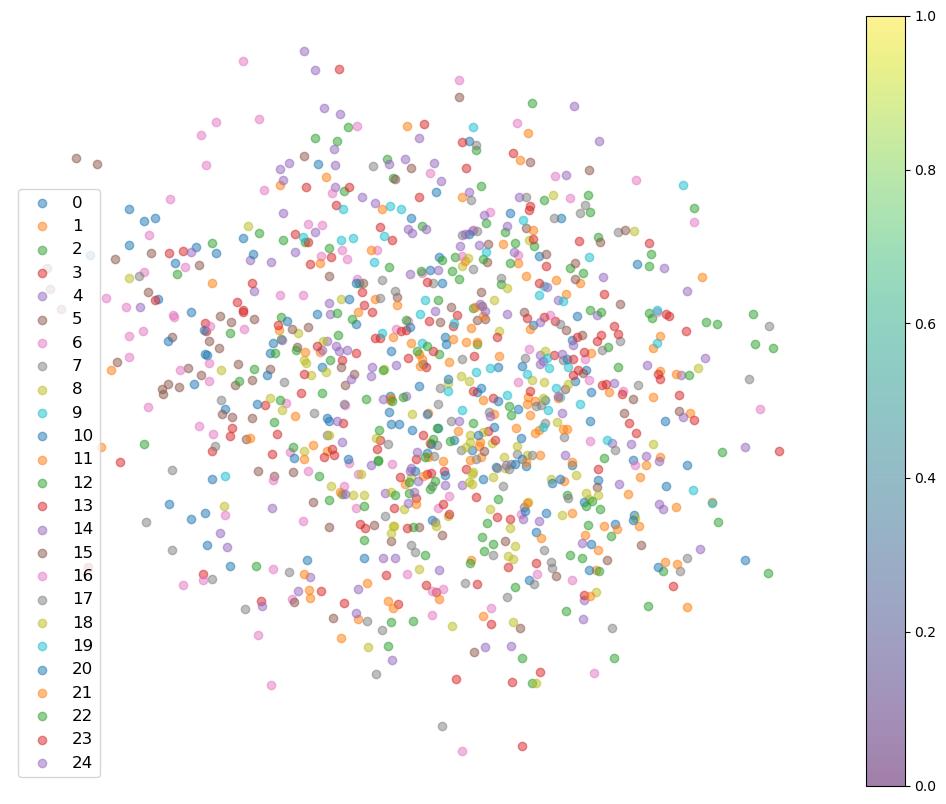

In [69]:
plot_principal_components(X_mds_reduced[:1000], y[:1000])

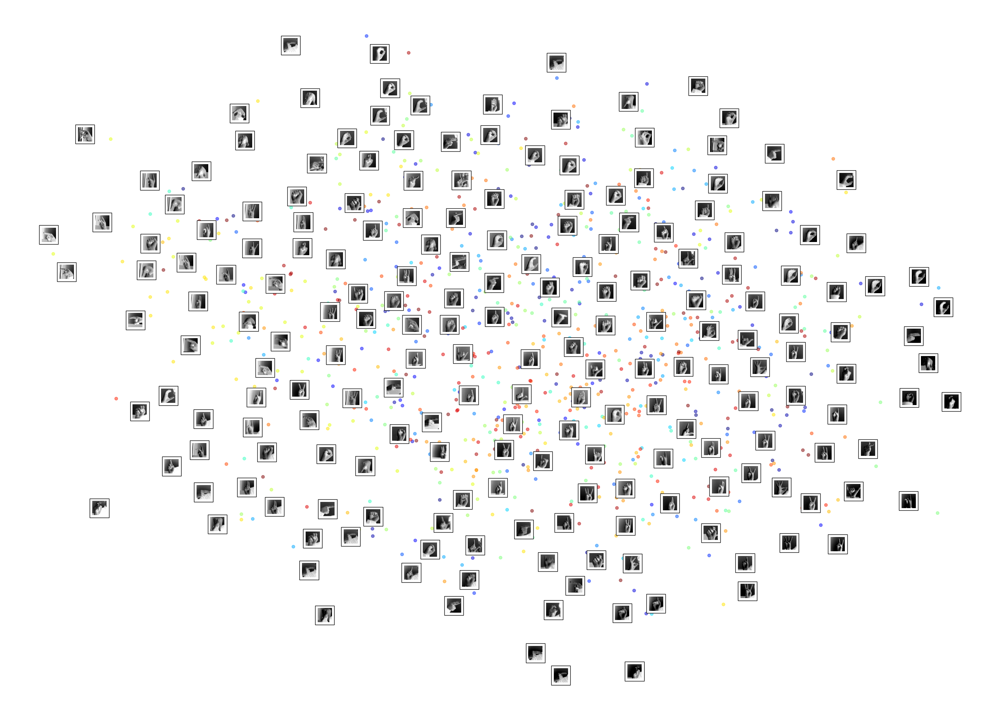

In [70]:
plot_digits(X_mds_reduced[:1000], y[:1000], images=X.values[:1000], figsize=(35, 25))

PCA, t-SNE, LLE and MDS are different dimentionality reduction techniques. We have visualized output of each method. 

Every visualization tries to show different clustering patterns between the data. For this example, we would generally prefer the visualization given by t-SNE. The data seems not that mutch visually separable, and is arranged in the form of parse clusters. If we look closely enough, t-SNE managed to cluster all the signs together. It has better performance over all other methodologies.

The observed differences, especially the skewed nature of LLE, could be due to its sensitivity to the local structure of high-dimensional data like images. High dimensionality and complex relationships among pixels might make it challenging for LLE to reconstruct the local geometry accurately, resulting in a distorted visualization.

When dealing with image data like in our case, t-SNE is often preferred for its ability to reveal clusters or local structures. PCA might provide a general overview but may not capture intricate details. MDS can offer a balance between preserving local and global structures. LLE's performance can vary significantly based on dataset characteristics and parameter settings, making it more sensitive and prone to distortion in high-dimensional or complex datasets like images.

Hence, in this case, either of PCA, t-SNE and MDS should be prefered (t-SNE, MDS and PCA, in that order).

In [256]:
random_sample = training_data.sample(n = 10000, random_state = 22)

In [257]:
X_train = random_sample
y_train = training_labels[random_sample.index]

In [258]:
pca = PCA(0.95)
X_train_pca = pca.fit_transform(X_train)

First of all, we will run K-Means algorithm for different size of clusters. We can use silhouette score and inertia as one of the metrics to determine the optimum cluster size.

In [262]:
from sklearn.cluster import KMeans

cluster_size_range = [15, 20, 25, 30, 35]
kmeans_per_k = []
for k in cluster_size_range:
    print(f"Fitting data for Cluster Size={k}")
    kmeans_obj = KMeans(n_clusters=k, random_state=42, init="random", n_init=50)
    kmeans_obj.fit(X_train_pca)
    kmeans_per_k.append(kmeans_obj)

Fitting data for Cluster Size=15
Fitting data for Cluster Size=20
Fitting data for Cluster Size=25
Fitting data for Cluster Size=30
Fitting data for Cluster Size=35


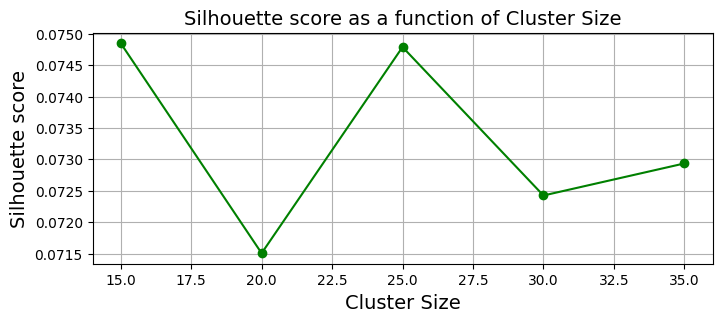

In [263]:
from sklearn.metrics import silhouette_score

silhouette_scores = [silhouette_score(X_train_pca, model.labels_) for model in kmeans_per_k]

plt.figure(figsize=(8, 3))
plt.plot(cluster_size_range, silhouette_scores, "go-")
plt.title("Silhouette score as a function of Cluster Size")
plt.xlabel("Cluster Size")
plt.ylabel("Silhouette score")
plt.grid()
plt.show()

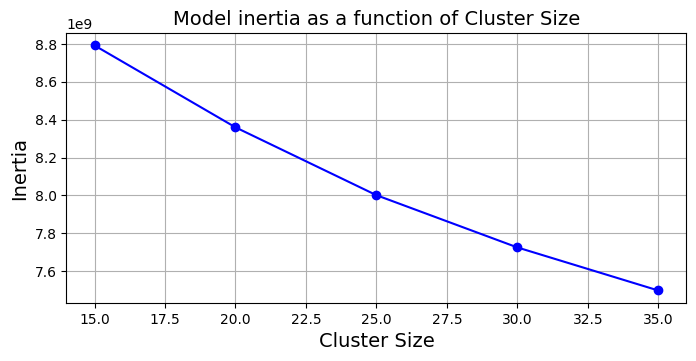

In [264]:
inertias = [model.inertia_ for model in kmeans_per_k]

plt.figure(figsize=(8, 3.5))
plt.plot(cluster_size_range, inertias, "bo-")
plt.title("Model inertia as a function of Cluster Size")
plt.xlabel("Cluster Size")
plt.ylabel("Inertia")
plt.grid()
plt.show()

* By looking at the Silhouette Score, we can se that the peak is at 25.
* By looking at the model inertia, the elbow is visible at the cluster size 25.

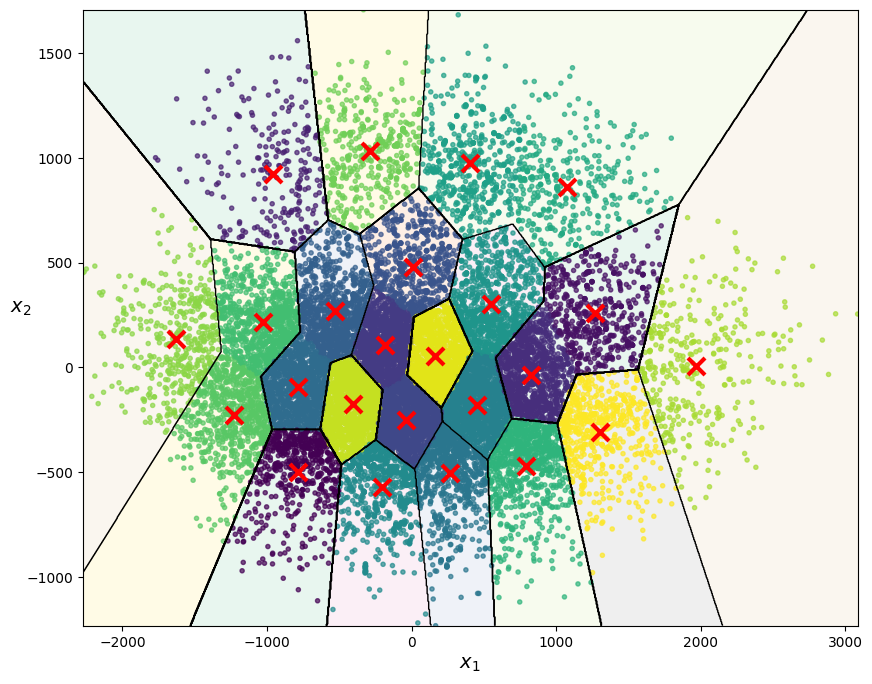

In [274]:
def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                              show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2", alpha=0.3)
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
               linewidths=1, colors='k')

    if show_centroids:
        centroids = clusterer.cluster_centers_
        plt.scatter(centroids[:, 0], centroids[:, 1],
                    marker='x', s=150, linewidths=3, color='r', zorder=10)


    plt.scatter(X[:, 0], X[:, 1], c=clusterer.labels_, cmap='viridis', marker='.', alpha=0.7)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
        
kmeans = KMeans(n_clusters=24, init="random", n_init=10, random_state=2)

pca = PCA(n_components=2)
transformed_data_pca = pca.fit_transform(training_data)

kmeans.fit(transformed_data_pca)
plt.figure(figsize=(10, 8))
plot_decision_boundaries(kmeans, transformed_data_pca)
plt.show()

In [271]:
best_model = kmeans_per_k[2]

In [272]:
def plot_items(items, labels, n_cols=5):
    n_rows = (len(items) - 1) // n_cols + 1
    plt.figure(figsize=(n_cols, n_rows * 1.1))
    for index, (item, label) in enumerate(zip(items, labels)):
        item = item.reshape(28,28)
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(item, cmap="gray")
        plt.axis("off")
        plt.title(label)
    plt.show()

For convinience, I have plotted first 20 images per cluster.

Cluster 0


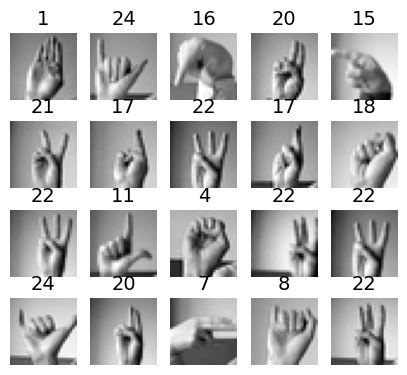

Cluster 1


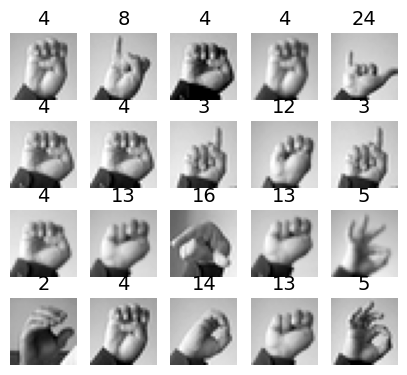

Cluster 2


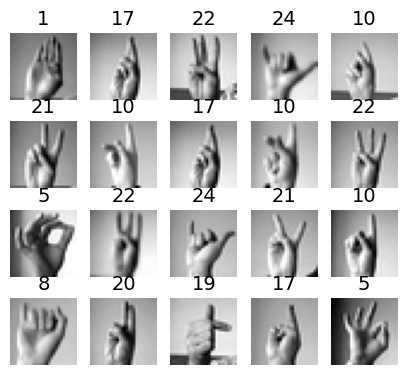

Cluster 3


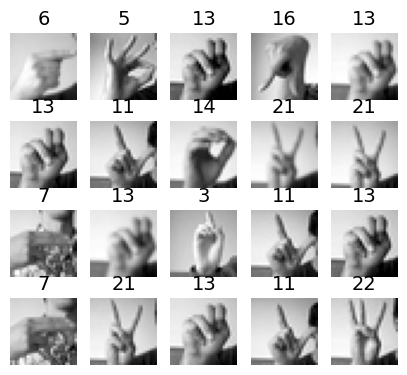

Cluster 4


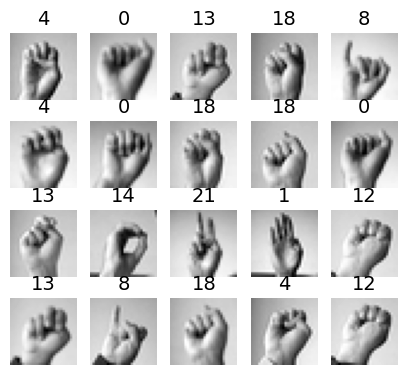

Cluster 5


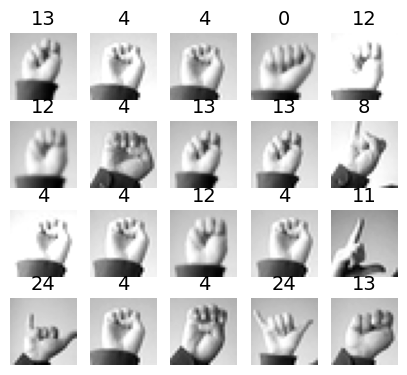

Cluster 6


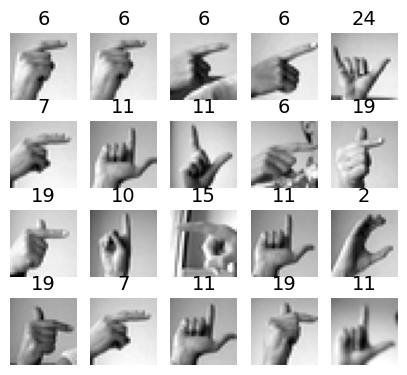

Cluster 7


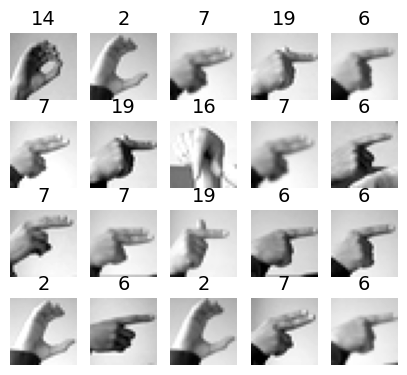

Cluster 8


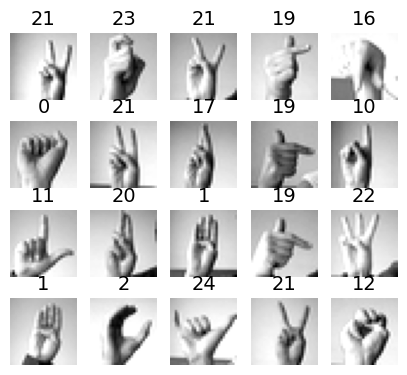

Cluster 9


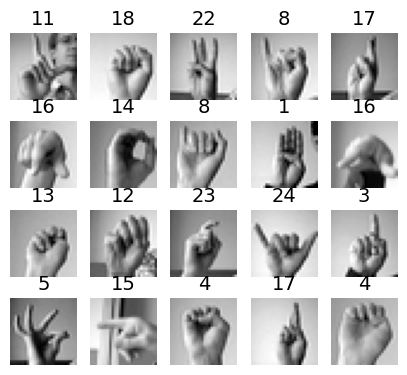

Cluster 10


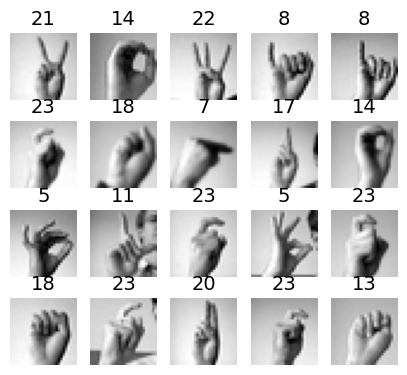

Cluster 11


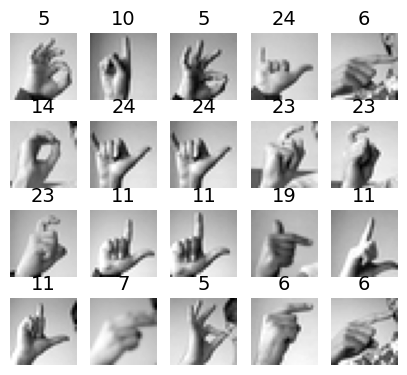

Cluster 12


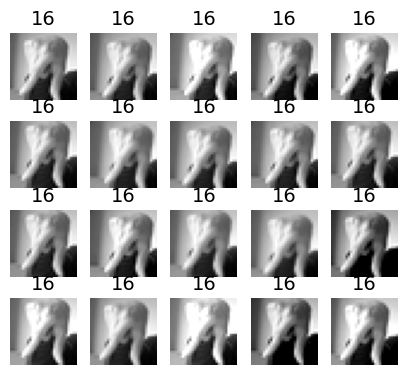

Cluster 13


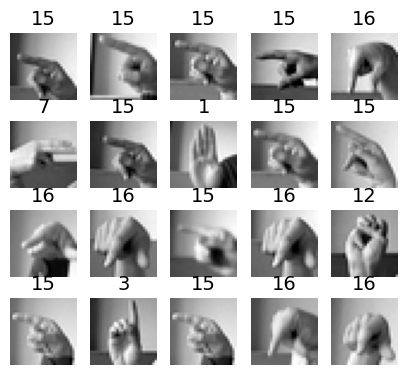

Cluster 14


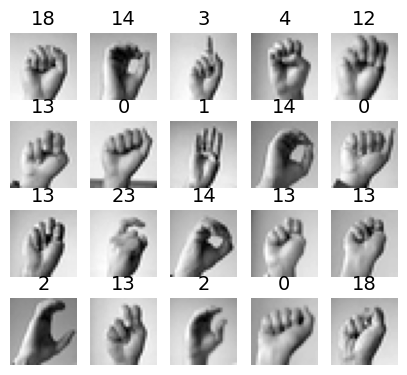

Cluster 15


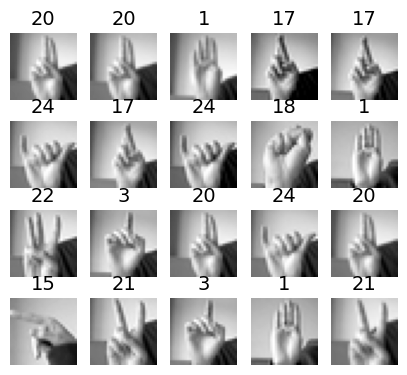

Cluster 16


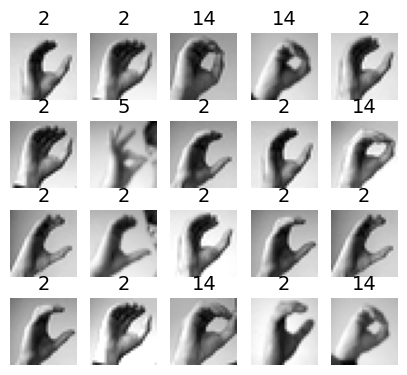

Cluster 17


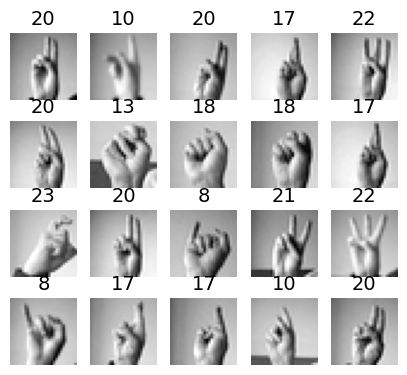

Cluster 18


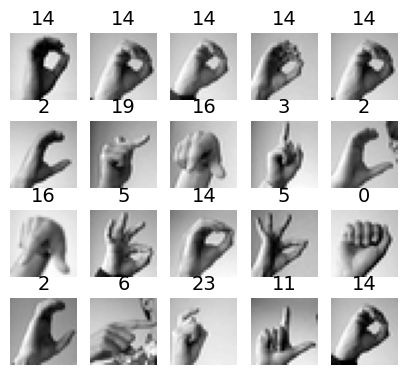

Cluster 19


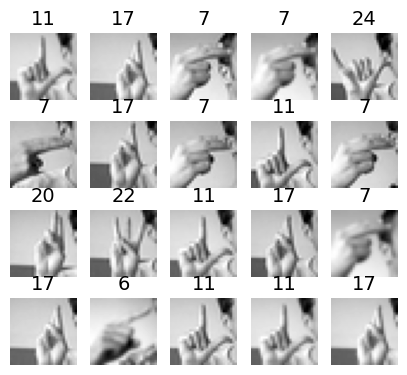

Cluster 20


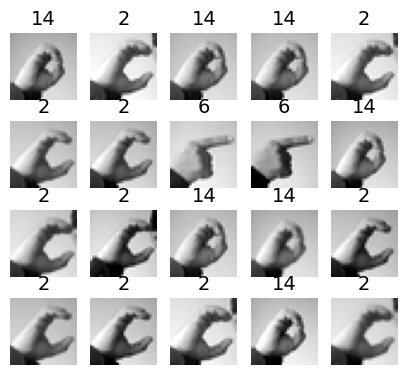

Cluster 21


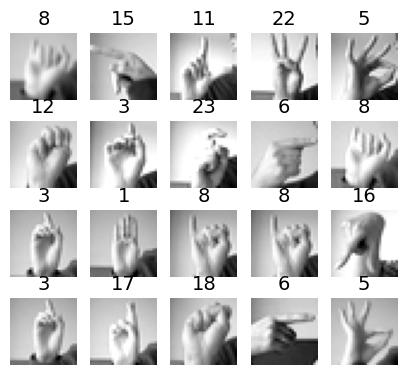

Cluster 22


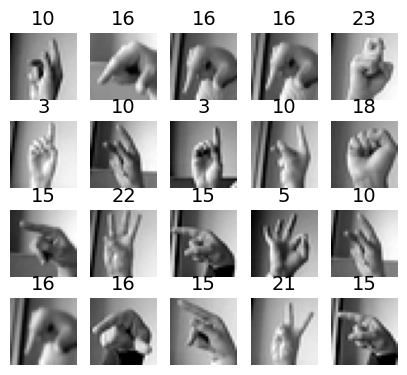

Cluster 23


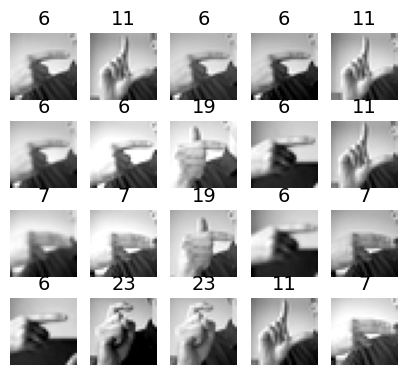

Cluster 24


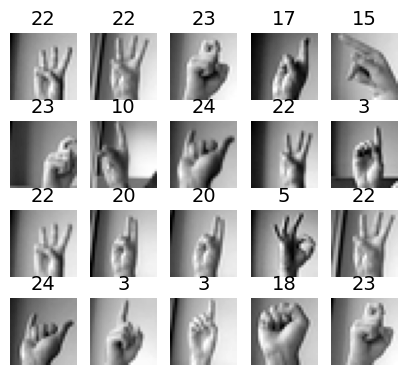

In [273]:
for cluster_id in np.unique(best_model.labels_):
    print("Cluster", cluster_id)
    in_cluster = best_model.labels_==cluster_id
    items = X_train[in_cluster]
    labels = y_train[in_cluster]
    plot_items(items.values[:20], labels[:20])

There are certain clusters like cluster 12,13,16,20 which contains most of the similar sign types. Also, if we take the generality into consideration, the K-means clustering has managed to cluster the items with similar hand guestures together. The algorithm has managed to cluster closed fists, circled fists and raised fingers together. But there are some clusters (cluster 3, cluster 6, cluster 7), which has incorrectly classified the data.

In [275]:
from sklearn.mixture import GaussianMixture

In [276]:
cluster_size_range = [5,10,15,20, 25,30]
gms_per_k = []
for k in cluster_size_range:
    print(f"Fitting data for Cluster Size={k}")
    gmm_model = GaussianMixture(n_components=k, n_init=10, random_state=42)
    gmm_model.fit(X_train_pca)
    gms_per_k.append(gmm_model)

Fitting data for Cluster Size=5
Fitting data for Cluster Size=10
Fitting data for Cluster Size=15
Fitting data for Cluster Size=20
Fitting data for Cluster Size=25
Fitting data for Cluster Size=30


In [278]:
BICS = [model.bic(X_train_pca) for model in gms_per_k]
AICS = [model.aic(X_train_pca) for model in gms_per_k]

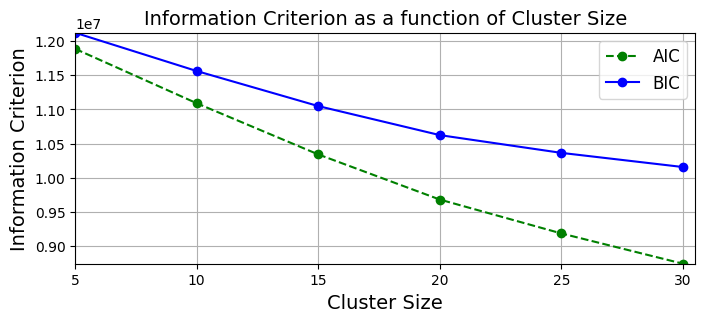

In [279]:
plt.figure(figsize=(8, 3))
plt.plot(cluster_size_range, AICS, "go--", label="AIC")
plt.plot(cluster_size_range, BICS, "bo-", label="BIC")
plt.title("Information Criterion as a function of Cluster Size")
plt.xlabel("Cluster Size")
plt.ylabel("Information Criterion")
plt.axis([min(cluster_size_range), max(cluster_size_range)+0.5, min(AICS) - 50, max(BICS) + 50])

plt.legend()
plt.grid()
plt.show()

If we look at the above figure, for Cluster Size = 25, both BIC and AIC scores are minimum. After Cluster Size = 25, BIC score decreases with AICs. If we have to find the optimum K, then it will be 25. Thus, we will select the number of clusters as 25.

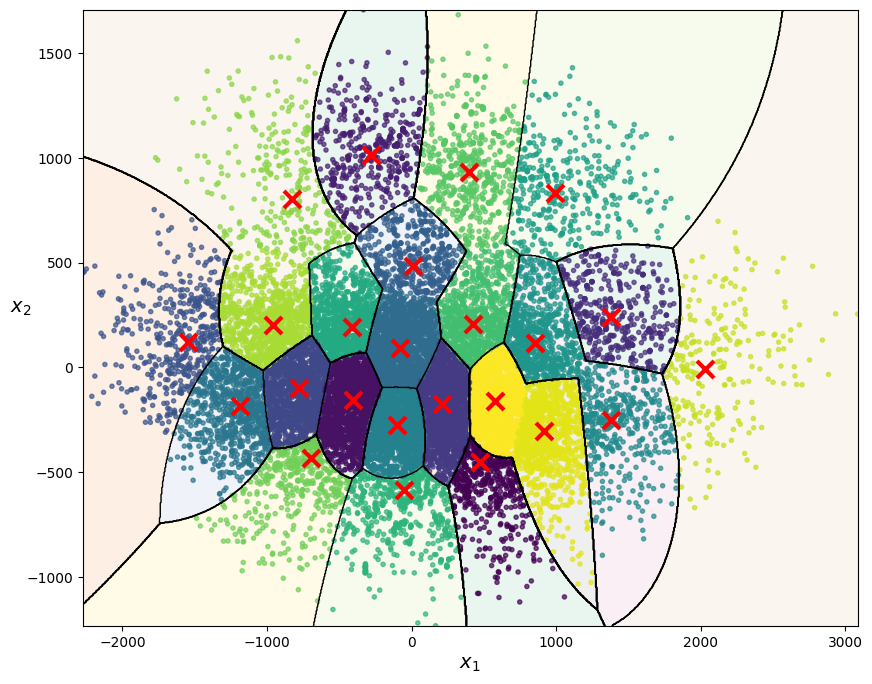

In [281]:
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import numpy as np

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                              show_xlabels=True, show_ylabels=True):
    mins = X.min(axis=0) - 0.1
    maxs = X.max(axis=0) + 0.1
    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2", alpha=0.3)
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
               linewidths=1, colors='k')

    if show_centroids:
        centroids = clusterer.means_
        plt.scatter(centroids[:, 0], centroids[:, 1],
                    marker='x', s=150, linewidths=3, color='r', zorder=10)

    plt.scatter(X[:, 0], X[:, 1], c=clusterer.predict(X), cmap='viridis', marker='.', alpha=0.7)

    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)

gmm = GaussianMixture(n_components=24, random_state=2)

pca = PCA(n_components=2)
transformed_data_pca = pca.fit_transform(training_data)

gmm.fit(transformed_data_pca)

plt.figure(figsize=(10, 8))
plot_decision_boundaries(gmm, transformed_data_pca)
plt.show()

In [282]:
best_gmm_model = gms_per_k[4]

In [283]:
best_gmm_model.n_components

25

For convinience, I have plotted first 20 images per cluster.

Cluster 0


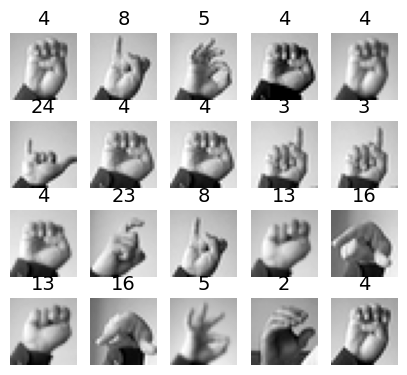

Cluster 1


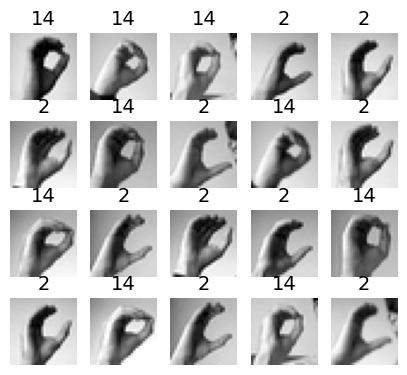

Cluster 2


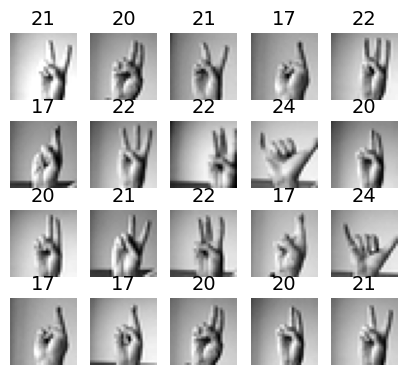

Cluster 3


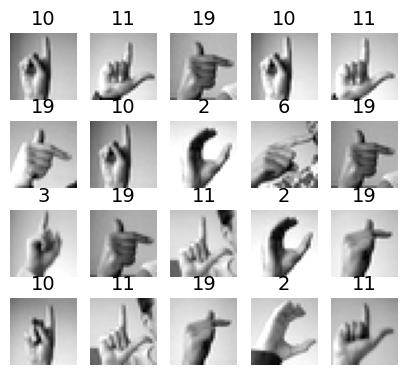

Cluster 4


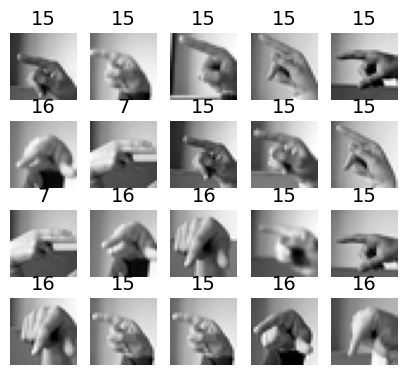

Cluster 5


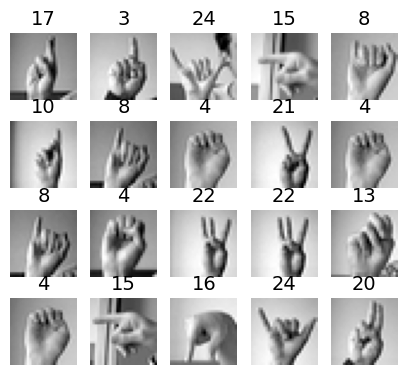

Cluster 6


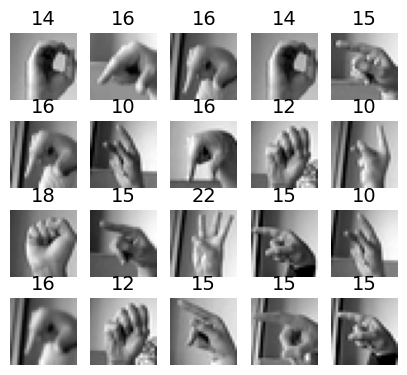

Cluster 7


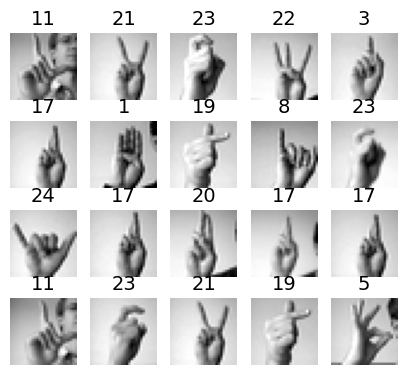

Cluster 8


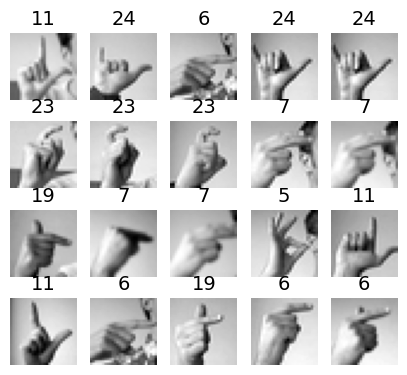

Cluster 9


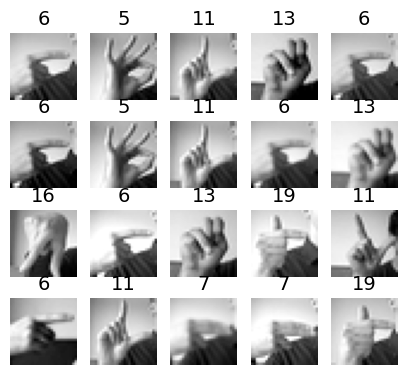

Cluster 10


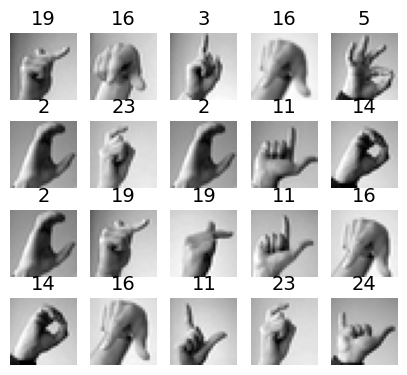

Cluster 11


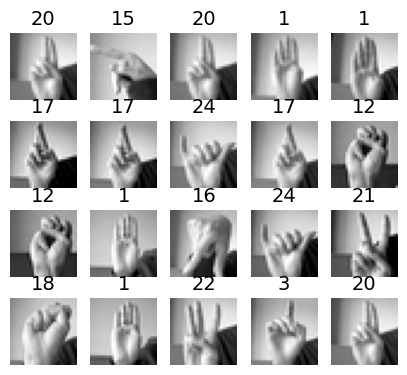

Cluster 12


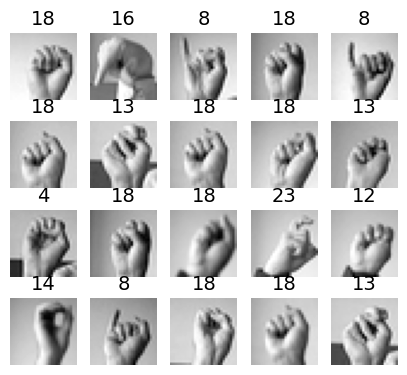

Cluster 13


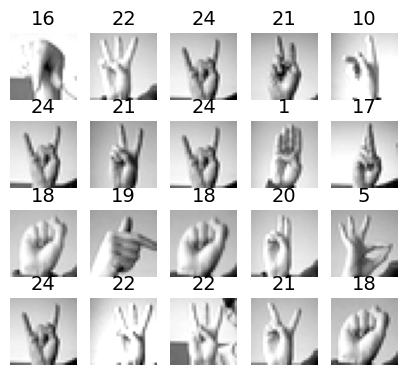

Cluster 14


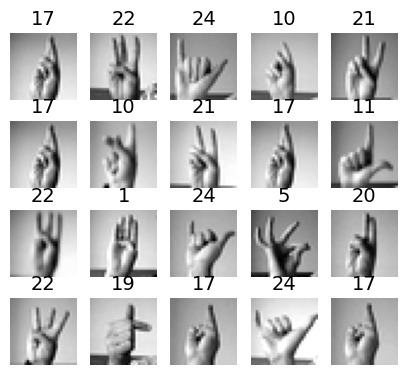

Cluster 15


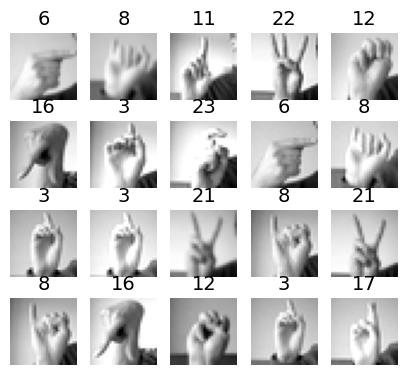

Cluster 16


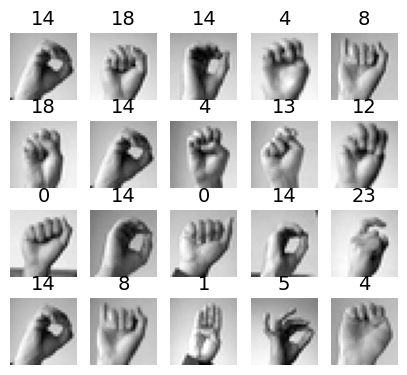

Cluster 17


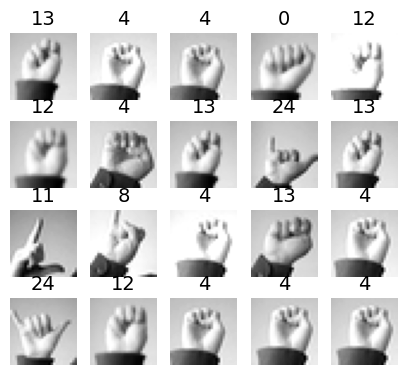

Cluster 18


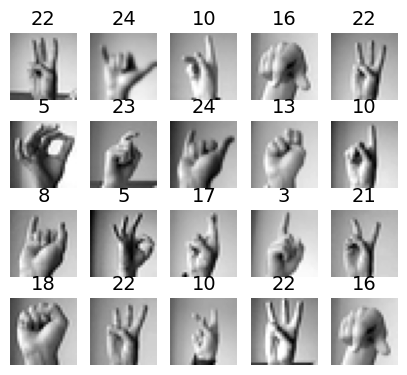

Cluster 19


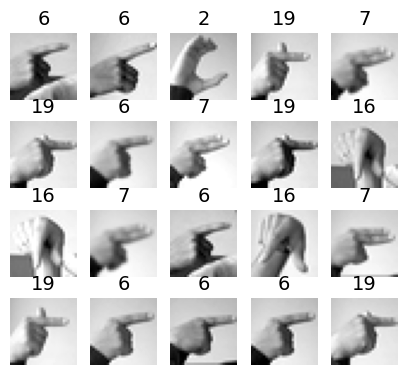

Cluster 20


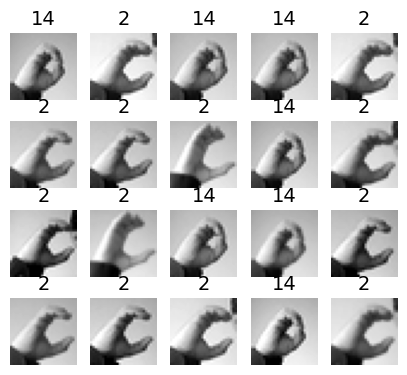

Cluster 21


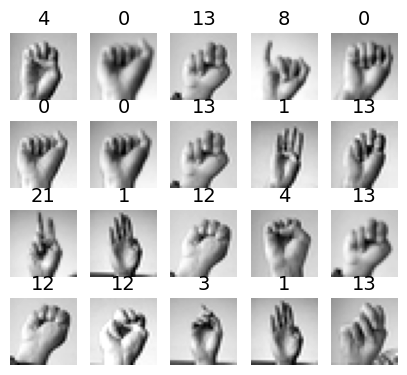

Cluster 22


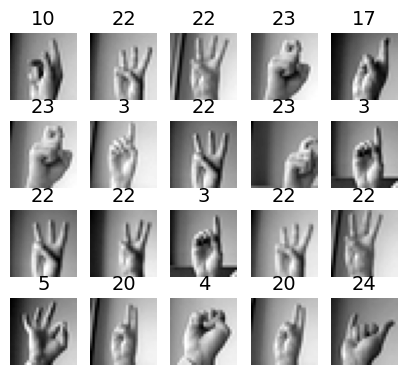

Cluster 23


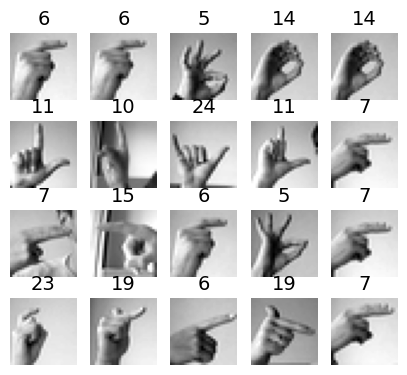

Cluster 24


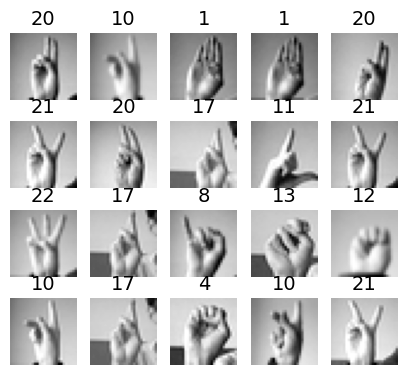

In [284]:
for cluster_id in range(best_gmm_model.n_components):
    print("Cluster", cluster_id)
    in_cluster = best_gmm_model.predict(X_train_pca) == cluster_id
    items = X_train[in_cluster]
    labels = y_train[in_cluster]
    plot_items(items.values[:20], labels[:20])

There are certain clusters like cluster 12,13,16,20 which contains most of the similar sign types. EM (GMM) has managed to cluster the items with similar gestures type together. The algorithm has managed to cluster closed fists, circled fists and raised fingers together. But there are some clusters (cluster 3, cluster 6, cluster 7), which has incorrectly classified the data.

In [285]:
gmm_model = GaussianMixture(n_components=best_gmm_model.n_components, n_init=10, random_state=22)

In [286]:
y_pred = gmm_model.fit_predict(X_train_pca)

In [ ]:
n_items = 20
gen_items_reduced, y_gen_items = gmm_model.sample(n_samples=n_items)
gen_items = pca.inverse_transform(gen_items_reduced)

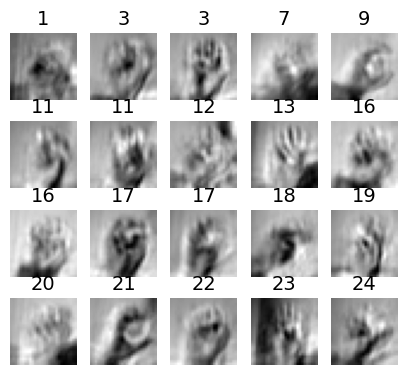

In [90]:
plot_items(gen_items, y_gen_items)

Thus we have generated images using GMM

In [313]:
split = StratifiedShuffleSplit(n_splits=1, test_size=1/6, random_state=22)
train_index, val_index = next(split.split(data, data_labels))

X_train = data.loc[train_index]
y_train = data_labels.loc[train_index]

X_valid = data.loc[val_index]
y_valid = data_labels.loc[val_index]

X_test = test_data
y_test = test_labels

In [314]:
print(X_train.shape, y_train.shape)
print(X_valid.shape, y_valid.shape)
print(X_test.shape, y_test.shape)

(22879, 784) (22879,)
(4576, 784) (4576,)
(7172, 784) (7172,)


In [315]:
from sklearn.decomposition import PCA

pca = PCA(0.95)
X_train_pca = pca.fit_transform(X_train)
X_valid_pca = pca.transform(X_valid)
X_test_pca = pca.transform(X_test)

In [316]:
pca.n_components_

113

In [317]:
np.unique(y_test)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24])

In [318]:
import time

def train_neural_net(model_name, X_train, y_train, X_valid, y_valid, learning_rate, activation_functions):
    start_time = time.time()
    tf.keras.backend.clear_session()
    tf.random.set_seed(42)
    if Path(model_name).is_dir():
        model = tf.keras.models.load_model(model_name)
        history=np.load(model_name+'\\trainHistory.npy',allow_pickle='TRUE').item()
    else:
        norm_layer = tf.keras.layers.Normalization(input_shape=X_train.shape[1:])
        model = tf.keras.Sequential([
        norm_layer,
        tf.keras.layers.Dense(200, activation=activation_functions["hidden_layer1"]),
        tf.keras.layers.Dense(50, activation=activation_functions["hidden_layer2"]),
        tf.keras.layers.Dense(25, activation=activation_functions["ouput_layer"])
        ])
        optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)
        model.compile(loss=tf.keras.metrics.sparse_categorical_crossentropy, optimizer=optimizer, metrics=[tf.keras.metrics.sparse_categorical_accuracy ])
        norm_layer.adapt(X_train)
        history = model.fit(X_train, y_train, epochs=100, validation_data=(X_valid, y_valid))
        model.save(model_name, save_format="tf")    
        np.save(model_name+'\\trainHistory.npy',history)
        
    training_time = time.time() - start_time

    return model, history, training_time

In [319]:
def plot_metrics(history):
    pd.DataFrame(history.history).plot(figsize=(8, 5))
    plt.grid(True)
    plt.gca().set_ylim(0, 1)
    plt.show()

In [320]:
def print_test_metrics(model, X_test, y_test, learning_rate):
    loss_test, accuracy_test = model.evaluate(X_test, y_test)
    print("\nFor learning Rate : ", learning_rate)
    print("\t Reported Loss on Test set : ", round(loss_test, 4))
    print("\t Reported accuracy on Test set : ", round(accuracy_test, 4))

In [321]:
activation_functions = {'hidden_layer1': 'relu', 
                        'hidden_layer2': 'relu',
                        'ouput_layer': 'softmax'}

Learning rate = 1e-3

In [333]:
learning_rate = 1e-3
model, history, training_time = train_neural_net("neural_net_LR1e-03", X_train, y_train, X_valid, y_valid, learning_rate, activation_functions)
print(f"Training time: {training_time:.2f} seconds")

Training time: 0.61 seconds


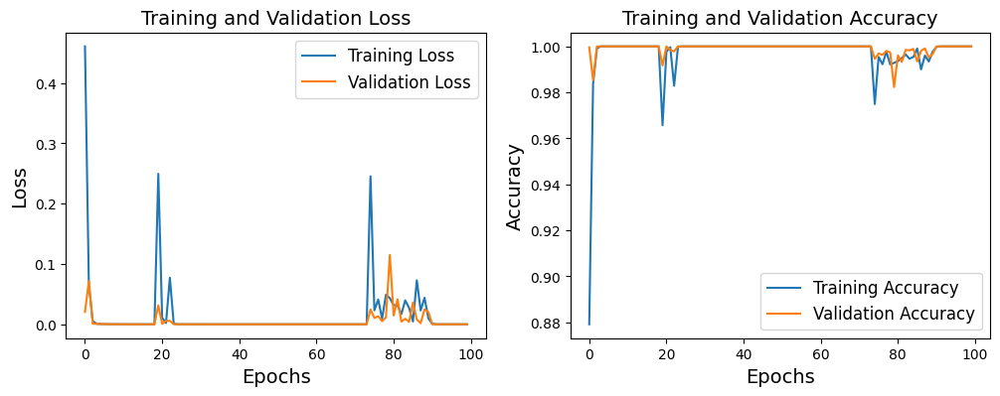

In [334]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['sparse_categorical_accuracy'], label='Training Accuracy')
plt.plot(history.history['val_sparse_categorical_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [335]:
print_test_metrics(model, X_test, y_test, learning_rate)

225/225 [==============================] - 1s 3ms/step - loss: 2.3705 - sparse_categorical_accuracy: 0.8172

For learning Rate :  0.001
	 Reported Loss on Test set :  2.3705
	 Reported accuracy on Test set :  0.8172


Learning Rate = 1e-5

In [336]:
learning_rate = 1e-5
model, history, training_time = train_neural_net("neural_net_LR1e-5", X_train, y_train, X_valid, y_valid, learning_rate, activation_functions)
print(f"Training time: {training_time:.2f} seconds")

Training time: 0.63 seconds


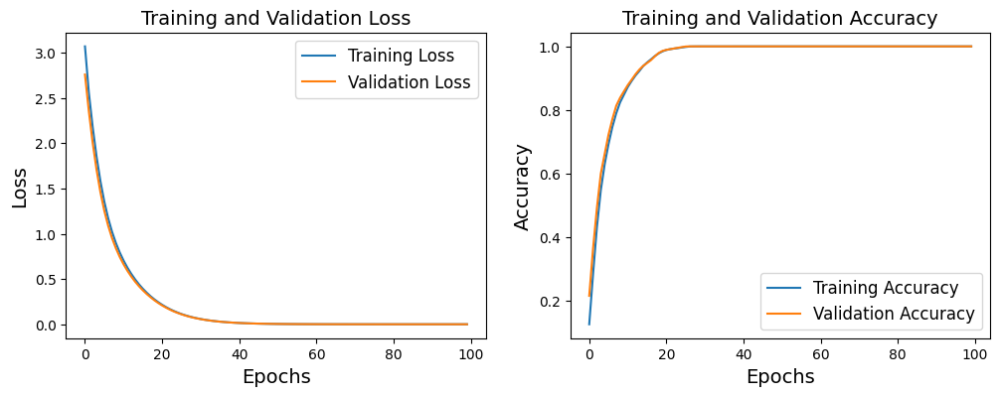

In [337]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['sparse_categorical_accuracy'], label='Training Accuracy')
plt.plot(history.history['val_sparse_categorical_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [338]:
print_test_metrics(model, X_test, y_test, learning_rate)

225/225 [==============================] - 1s 3ms/step - loss: 1.2003 - sparse_categorical_accuracy: 0.8217

For learning Rate :  1e-05
	 Reported Loss on Test set :  1.2003
	 Reported accuracy on Test set :  0.8217


Learning Rate = 1e-9

In [106]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)

In [348]:
learning_rate = 1e-9
model, history, training_time = train_neural_net("neural_net_LR1e-9", X_train, y_train, X_valid, y_valid, learning_rate, activation_functions)
print(f"Training time: {training_time:.2f} seconds")

Training time: 0.62 seconds


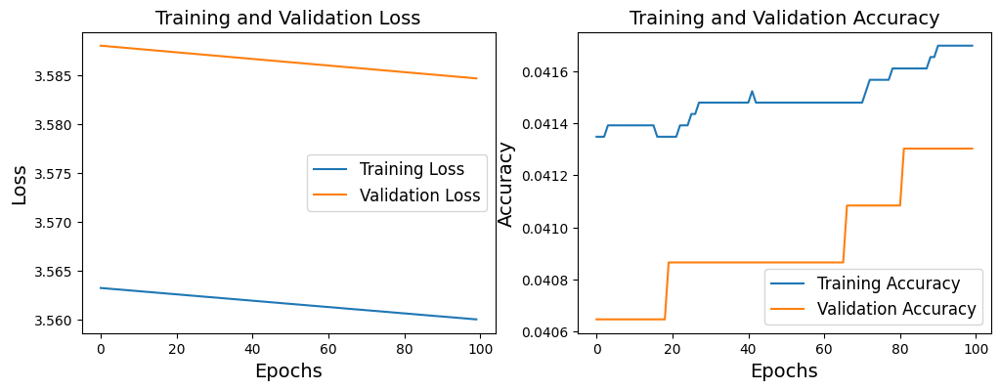

In [349]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['sparse_categorical_accuracy'], label='Training Accuracy')
plt.plot(history.history['val_sparse_categorical_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [350]:
print_test_metrics(model, X_test, y_test, learning_rate)

225/225 [==============================] - 1s 3ms/step - loss: 3.4919 - sparse_categorical_accuracy: 0.0452

For learning Rate :  1e-09
	 Reported Loss on Test set :  3.4919
	 Reported accuracy on Test set :  0.0452


The best performing learning rate is 0.00001 i.e. 1e-5 with reported loss = 120.03% Accuracy : 82.17%

The model is trained under below architecture

In [110]:
model = tf.keras.Sequential([
tf.keras.layers.Normalization(input_shape=X_train.shape[1:]),
tf.keras.layers.Dense(200, activation=activation_functions["hidden_layer1"]),
tf.keras.layers.Dense(50, activation=activation_functions["hidden_layer2"]),
tf.keras.layers.Dense(25, activation=activation_functions["ouput_layer"])
])

In [352]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization (Normalizati  (None, 784)               1569      
 on)                                                             
                                                                 
 dense (Dense)               (None, 200)               157000    
                                                                 
 dense_1 (Dense)             (None, 50)                10050     
                                                                 
 dense_2 (Dense)             (None, 25)                1275      
                                                                 
Total params: 169894 (663.65 KB)
Trainable params: 168325 (657.52 KB)
Non-trainable params: 1569 (6.13 KB)
_________________________________________________________________


1. This network has a total of 169,894 parameters, out of which 1668, 325 are trainable and 1,569 are non-trainable.

2. For the given architecture, the bias parameters are as follows:
* The first dense layer with 200 neurons will have 200 bias parameters.
* The second dense layer with 50 neurons will have 50 bias parameters.
* The third dense layer with 25 neurons will have 25 bias parameters.
* Adding these together, the total number of bias parameters in this network would be 200 + 50 + 25 = 275.

Final Observations : 

1. The model with learning rate 1e-5 performs better for the other two learning rates (1e-3 and 1e-5) with ReLU activation. One of the reason that may be empowering this is the complexity of the model. I believe that had the network been more complex, I might have been able to see some differences.
2. Also, as our dataset is MNIST like, one of the possibility is that the model might be learned the linear combination of features.
3. The other possibility I can think of is that the ReLU might have overfitted on the training data causing it to give huge loss on the test data.
4. The loss in my case for both the models is high and more hyperparameter tuning is required to minimize the loss and imoprove accuracy